# Demand forecasting with the Temporal Fusion Transformer

**Content**
1. Load data
2. Create baseline model
3. Train the Temporal Fusion Transformer
4. Predict on selected data

References:
- https://pytorch-forecasting.readthedocs.io/en/latest/tutorials/stallion.html
-

In this tutorial, we will train the :py:class:`~pytorch_forecasting.models.temporal_fusion_transformer.TemporalFusionTransformer` on a very small dataset to demonstrate that it even does a good job on only 20k samples. Generally speaking, it is a large model and will therefore perform much better with more data.

Our example is a demand forecast from the [Stallion kaggle competition](https://www.kaggle.com/utathya/future-volume-prediction).

In [3]:
import os
import warnings

warnings.filterwarnings("ignore")  # avoid printing out absolute paths

import copy
from pathlib import Path
import warnings

import numpy as np
import pandas as pd
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
import torch

from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
from pytorch_forecasting.models.rnn import RecurrentNetwork


import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

from torch.utils.data import DataLoader, TensorDataset
from typing import Optional

import os, os.path, requests, datetime
import numpy as np
import pandas as pd
import bs4 as bs
import yfinance



## 1. Load data

First, we need to transform our time series into a pandas dataframe where each row can be identified with a time step and a time series. Fortunately, most datasets are already in this format. For this tutorial, we will use the [Stallion dataset from Kaggle](https://www.kaggle.com/utathya/future-volume-prediction) describing sales of various beverages. Our task is to make a six-month forecast of the sold volume by stock keeping units (SKU), that is products, sold by an agency, that is a store. There are about 21 000 monthly historic sales records. In addition to historic sales we have information about the sales price, the location of the agency, special days such as holidays, and volume sold in the entire industry.

The dataset is already in the correct format but misses some important features. Most importantly, we need to add a time index that is incremented by one for each time step. Further, it is beneficial to add date features, which in this case means extracting the month from the date record.

In [5]:
class SP500DataModule(pl.LightningDataModule):
    """Data module for the 'Standard and Poor 500' company performance data."""

    URL = "http://en.wikipedia.org/wiki/List_of_S%26P_500_companies"

    def __init__(self, batch_size=32, train_val_test_split=[80,10,10], spy_binary=True, path=".", force_download=False):
        super().__init__()
        # download properties
        self.start = datetime.datetime(2010, 1, 1)
        self.end = datetime.datetime.now()
        self.fname = path + "/sp500.csv"
        self.force_download = force_download
        # prepare and transform properties
        self.spy_binary = spy_binary
        self.batch_size = batch_size
        self.train_val_test_split = train_val_test_split
        # data
        self.data = None
        self.train_dataset = None
        self.val_dataset = None
        self.test_dataset = None

    def prepare_data(self):
        """Download and prepare the SP500 data."""
        df = self._download_sp500()
        if self.spy_binary:
            df.SPY = [1 if spy > 0 else 0 for spy in df.SPY]
        self.data = df


    def setup(self, stage: Optional[str] = None):
        """Setup the data according the stage 'fit' or 'test'. If the stage is none, setup the data for all stages."""

        # Split data into test, val and train dataframes
        train_percent, val_percent, test_percent = self.train_val_test_split
        rows = self.data.shape[0]
        test_rows = int(test_percent * rows / 100)
        val_rows = int(val_percent * rows / 100)
        train_rows =  rows - test_rows - val_rows

        print("Setup - define data split:")
        print("- Train rows : {0:04d} ( {1}%)".format(train_rows, train_percent))
        print("- Val   rows : {0:04d} ( {1}%)".format(val_rows, val_percent))
        print("- Test  rows : {0:04d} ( {1}%)".format(test_rows, test_percent))
        print("- Total rows : {0:04d} (100%)".format(rows))

        print("Setup - split and transform data for stage: {}".format(stage))
        if stage == "fit" or stage is None:
            train_data = self.data.iloc[:train_rows]
            val_data = self.data.iloc[train_rows:train_rows+val_rows]
            print("- Train shape: {}".format(train_data.shape))
            print("- Val   shape: {}".format(val_data.shape))
            # transform data and assign properties to use in data loaders
            self.train_dataset = self._transform_to_dataset(train_data)
            self.val_dataset = self._transform_to_dataset(val_data)

        if stage == "test" or stage is None:
            test_data = self.data.iloc[train_rows+val_rows:]
            print("- Test  shape: {}".format(test_data.shape))
            # transform data and assign properties to use in data loaders
            self.test_dataset = self._transform_to_dataset(test_data)

        print("- Total shape: {}".format(self.data.shape))


    def size(self):
        return self.train_dataloader().dataset.tensors[0].data.shape[1]

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.batch_size)

    def test_dataloader(self):
        return DataLoader(self.test_dataset, batch_size=self.batch_size)

    def _transform_to_dataset(self, df):

        # Split labels and features
        labels = df.SPY.values
        features = df.iloc[:, :-1].values

        # Convert to tensor
        tensor_labels   = torch.tensor(labels).unsqueeze(1).float()
        tensor_features = torch.tensor(features).float()

        # Create tensor dataset
        return TensorDataset(tensor_features, tensor_labels)

    def _download_sp500(self) -> pd.DataFrame:
        """Download the SP500 data from the internet, save data to a csv file and return the result.

        Notes:
        - All further calls will serve the data from the csv file.
        - To trigger a new download from the internet, set the force_download flag to True.
        """

        # Load data from file
        if os.path.isfile(self.fname) and not self.force_download:
            print("Load SP500 from file:", self.fname)
            return pd.read_csv(self.fname, index_col=0, parse_dates=True)

        # Download data
        print("Download data from:", SP500DataModule.URL)
        resp = requests.get(SP500DataModule.URL)
        soup = bs.BeautifulSoup(resp.text, 'lxml')
        table = soup.find('table', {'class': 'wikitable sortable'})

        tickers = []
        for row in table.findAll('tr')[1:]:
            ticker = row.findAll('td')[0].text
            tickers.append(ticker)

        tickers = [s.replace('\n', '') for s in tickers]
        data = yfinance.download(tickers, start=self.start, end=self.end)
        df_data = data['Adj Close']

        df_spy = yfinance.download("SPY", start=self.start, end=self.end)
        df_spy = df_spy.loc[:, ['Adj Close']]
        df_spy.columns = ['SPY']

        df = pd.concat([df_data, df_spy], axis=1)

        # Prepare data
        df.dropna(axis=0, how='all', inplace=True)
        print("Dropping columns due to nans > 50%:", df.loc[:, list((100 * (df.isnull().sum() / len(df.index)) > 50))].columns)
        df = df.drop(df.loc[:, list((100 * (df.isnull().sum() / len(df.index)) > 50))].columns, 1)
        df = df.ffill().bfill()
        print("Any columns still contain nans:", df.isnull().values.any())

        df_returns = pd.DataFrame()
        for name in df.columns:
            df_returns[name] = np.log(df[name]).diff()

        df_returns.dropna(axis=0, how='any', inplace=True)

        # Save data and return result
        print("Save data to file:", self.fname)
        df_returns.to_csv(self.fname)

        self.data = df_returns
        return self.data


dm = SP500DataModule(spy_binary=False)
dm.prepare_data()
dm.setup()

print("Data Type:")
print(type(dm.data))


Load SP500 from file: ./sp500.csv
Setup - define data split:
- Train rows : 2392 ( 80%)
- Val   rows : 0299 ( 10%)
- Test  rows : 0299 ( 10%)
- Total rows : 2990 (100%)
Setup - split and transform data for stage: None
- Train shape: (2392, 490)
- Val   shape: (299, 490)
- Test  shape: (299, 490)
- Total shape: (2990, 490)
Data Type:
<class 'pandas.core.frame.DataFrame'>


In [6]:
dm.data.head()


,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,...,XLNX,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS,SPY
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,0.007375,-0.014569,-0.002473,0.015445,0.0,0.021253,0.001145,0.008668,0.013641,0.008393,...,0.012689,0.013980,0.004539,0.0,0.003426,0.015278,0.011224,0.038231,0.0,0.016817
2010-01-05,-0.010922,0.107246,-0.005962,0.001727,0.0,-0.007160,-0.024321,-0.008112,0.006162,0.016313,...,-0.012689,0.003897,-0.011959,0.0,-0.003426,0.031165,-0.001745,0.034651,0.0,0.002644
2010-01-06,-0.003559,-0.042314,0.008682,-0.016034,0.0,-0.009501,-0.015358,0.005539,0.010574,-0.002124,...,-0.006807,0.008606,0.006566,0.0,-0.007174,-0.000323,-0.007717,0.083382,0.0,0.000704
2010-01-07,-0.001297,0.029044,-0.000247,-0.001850,0.0,-0.016166,0.000000,0.008250,-0.000935,-0.019595,...,-0.010095,-0.003147,0.013005,0.0,-0.000288,0.022681,-0.025318,0.106160,0.0,0.004212
2010-01-08,-0.000325,-0.019268,0.003945,0.006626,0.0,0.010807,-0.020446,0.005099,-0.003986,-0.005436,...,0.014505,-0.004020,0.000000,0.0,0.000288,-0.021228,-0.003256,-0.016320,0.0,0.003322


In [43]:
from datetime import datetime

data = dm.data
data['date'] = data.index.to_pydatetime()

data["time_idx"] = data["date"].dt.year * 12 * 31 + data["date"].dt.month * 31 + data["date"].dt.day
data["time_idx"] -= data["time_idx"].min()

data.head(20)

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,...,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS,SPY,date,time_idx
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,0.007375,-0.014569,-0.002473,0.015445,0.0,0.021253,0.001145,0.008668,0.013641,0.008393,...,0.004539,0.0,0.003426,0.015278,0.011224,0.038231,0.0,0.016817,2010-01-04,0
2010-01-05,-0.010922,0.107246,-0.005962,0.001727,0.0,-0.007160,-0.024321,-0.008112,0.006162,0.016313,...,-0.011959,0.0,-0.003426,0.031165,-0.001745,0.034651,0.0,0.002644,2010-01-05,1
2010-01-06,-0.003559,-0.042314,0.008682,-0.016034,0.0,-0.009501,-0.015358,0.005539,0.010574,-0.002124,...,0.006566,0.0,-0.007174,-0.000323,-0.007717,0.083382,0.0,0.000704,2010-01-06,2
2010-01-07,-0.001297,0.029044,-0.000247,-0.001850,0.0,-0.016166,0.000000,0.008250,-0.000935,-0.019595,...,0.013005,0.0,-0.000288,0.022681,-0.025318,0.106160,0.0,0.004212,2010-01-07,3
2010-01-08,-0.000325,-0.019268,0.003945,0.006626,0.0,0.010807,-0.020446,0.005099,-0.003986,-0.005436,...,0.000000,0.0,0.000288,-0.021228,-0.003256,-0.016320,0.0,0.003322,2010-01-08,4
2010-01-11,0.000649,-0.019647,-0.009891,-0.008861,0.0,0.011071,-0.018394,0.005073,-0.000940,-0.013169,...,0.012839,0.0,0.017134,0.021860,0.003256,0.006075,0.0,0.001396,2010-01-11,7
2010-01-12,-0.012078,0.007905,-0.017549,-0.011440,0.0,0.006810,-0.023796,-0.002896,-0.006369,-0.015306,...,-0.007236,0.0,0.018792,-0.019443,-0.001084,-0.028258,0.0,-0.009370,2010-01-12,8
2010-01-13,0.007851,0.075794,0.013814,0.014007,0.0,0.019419,0.008833,0.009449,0.011294,0.017237,...,0.013870,0.0,0.003070,0.006576,0.014001,0.018519,0.0,0.008411,2010-01-13,9
2010-01-14,0.014877,0.019874,-0.013308,-0.005808,0.0,0.006267,0.035784,0.001085,0.008852,-0.010529,...,0.007411,0.0,0.010808,0.002874,0.002848,0.021779,0.0,0.002701,2010-01-14,10


In [ ]:

# add additional features (log damit wert nicht 0 wird)
# data["month"] = data.date.dt.month.astype(str).astype("category")  # categories have be strings
# data["log_volume"] = np.log(data.volume + 1e-8)
# data["avg_volume_by_sku"] = data.groupby(["time_idx", "sku"], observed=True).volume.transform("mean")
# data["avg_volume_by_agency"] = data.groupby(["time_idx", "agency"], observed=True).volume.transform("mean")

# we want to encode special days as one variable and thus need to first reverse one-hot encoding
# special_days = [
#     "easter_day",
#     "good_friday",
#     "new_year",
#     "christmas",
#     "labor_day",
#     "independence_day",
#     "revolution_day_memorial",
#     "regional_games",
#     "fifa_u_17_world_cup",
#     "football_gold_cup",
#     "beer_capital",
#     "music_fest",
# ]
# data[special_days] = data[special_days].apply(lambda x: x.map({0: "-", 1: x.name})).astype("category")
# data.sample(10, random_state=521)

In [51]:
features_columns = list(data.columns.values[:-3])
features_columns


['A',
 'AAL',
 'AAP',
 'AAPL',
 'ABBV',
 'ABC',
 'ABMD',
 'ABT',
 'ACN',
 'ADBE',
 'ADI',
 'ADM',
 'ADP',
 'ADSK',
 'AEE',
 'AEP',
 'AES',
 'AFL',
 'AIG',
 'AIZ',
 'AJG',
 'AKAM',
 'ALB',
 'ALGN',
 'ALK',
 'ALL',
 'ALLE',
 'AMAT',
 'AMCR',
 'AMD',
 'AME',
 'AMGN',
 'AMP',
 'AMT',
 'AMZN',
 'ANET',
 'ANSS',
 'ANTM',
 'AON',
 'AOS',
 'APA',
 'APD',
 'APH',
 'APTV',
 'ARE',
 'ATO',
 'ATVI',
 'AVB',
 'AVGO',
 'AVY',
 'AWK',
 'AXP',
 'AZO',
 'BA',
 'BAC',
 'BAX',
 'BBWI',
 'BBY',
 'BDX',
 'BEN',
 'BIIB',
 'BIO',
 'BK',
 'BKNG',
 'BKR',
 'BLK',
 'BLL',
 'BMY',
 'BR',
 'BRO',
 'BSX',
 'BWA',
 'BXP',
 'C',
 'CAG',
 'CAH',
 'CAT',
 'CB',
 'CBOE',
 'CBRE',
 'CCI',
 'CCL',
 'CDNS',
 'CDW',
 'CE',
 'CERN',
 'CF',
 'CFG',
 'CHD',
 'CHRW',
 'CHTR',
 'CI',
 'CINF',
 'CL',
 'CLX',
 'CMA',
 'CMCSA',
 'CME',
 'CMG',
 'CMI',
 'CMS',
 'CNC',
 'CNP',
 'COF',
 'COO',
 'COP',
 'COST',
 'CPB',
 'CPRT',
 'CRL',
 'CRM',
 'CSCO',
 'CSX',
 'CTAS',
 'CTLT',
 'CTRA',
 'CTSH',
 'CTXS',
 'CVS',
 'CVX',
 'CZR',
 'D',


In [53]:
data['group_id'] = 0
data.head()

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,...,XYL,YUM,ZBH,ZBRA,ZION,ZTS,SPY,date,time_idx,group_id
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,0.007375,-0.014569,-0.002473,0.015445,0.0,0.021253,0.001145,0.008668,0.013641,0.008393,...,0.0,0.003426,0.015278,0.011224,0.038231,0.0,0.016817,2010-01-04,0,0
2010-01-05,-0.010922,0.107246,-0.005962,0.001727,0.0,-0.007160,-0.024321,-0.008112,0.006162,0.016313,...,0.0,-0.003426,0.031165,-0.001745,0.034651,0.0,0.002644,2010-01-05,1,0
2010-01-06,-0.003559,-0.042314,0.008682,-0.016034,0.0,-0.009501,-0.015358,0.005539,0.010574,-0.002124,...,0.0,-0.007174,-0.000323,-0.007717,0.083382,0.0,0.000704,2010-01-06,2,0
2010-01-07,-0.001297,0.029044,-0.000247,-0.001850,0.0,-0.016166,0.000000,0.008250,-0.000935,-0.019595,...,0.0,-0.000288,0.022681,-0.025318,0.106160,0.0,0.004212,2010-01-07,3,0
2010-01-08,-0.000325,-0.019268,0.003945,0.006626,0.0,0.010807,-0.020446,0.005099,-0.003986,-0.005436,...,0.0,0.000288,-0.021228,-0.003256,-0.016320,0.0,0.003322,2010-01-08,4,0


### Create dataset and dataloaders

In [58]:
max_prediction_length = 6   # Anzahl timestepts für Vorhersage (prediction)
max_encoder_length    = 24  # Anzahl Timesteps für Training
                            # Training cutoff: total - perdiction, d.h. wir verwenden alles
training_cutoff = data["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    data[lambda x: x.time_idx <= training_cutoff],
    time_idx="time_idx",                            # Zeit Index
    group_ids=["group_id"],

    target="SPY",

    # group_ids=["agency", "sku"],                    # Preprocessing: Normaliserung und Encoding je Gruppe.

                                                    # Es kann variert werden zwischen min und max
    min_encoder_length=max_encoder_length // 2,     # keep encoder length long (as it is in the validation set)
    max_encoder_length=max_encoder_length,          #

    min_prediction_length=1,                        # Er kann auch weniger TimeSteps prediction, wenn zu wenig Daten vorhanden sind
    max_prediction_length=max_prediction_length,

    # statics
    # static_categoricals=["agency", "sku"],
    # static_reals=["avg_population_2017", "avg_yearly_household_income_2017"],

    # time varying known (Planwerte) (es wird ein LSTM je Kategorie gebaut und verwendet)
    # time_varying_known_categoricals=["special_days", "month"],  # known (Plan Werte)
    # variable_groups={"special_days": special_days},             # group of categorical variables can be treated as one variable

    # time_varying_known_reals=["time_idx", "price_regular", "discount_in_percent"],
    # Frage Ilja: time_varying_known_reals=["time_idx"],

    # time varying unknown (es wird ein LSTM je Kategorie gebaut und verwendet)
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=features_columns,

    # target_normalizer=GroupNormalizer(                          # TODO ti: auskommentiern wenn log target verwendet wird
    #     groups=["agency", "sku"], transformation="softplus"     # Use softplus and normalize by group
    # ),                                                          # Normalisieurung 8 -> 1,22 zurück 8.5 != exp(8)

    # variablen die zusätzlich erstellt werden durch netzwerk
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
    allow_missing_timesteps=True
)

# create validation set (predict=True)
# which means to predict the last max_prediction_length points in time for each series
validation = TimeSeriesDataSet.from_dataset(training, data, predict=True, stop_randomization=True)

# create dataloaders for model
batch_size = 128  # set this between 32 to 128

# create data loaders
train_dataloader = training.to_dataloader  (train=True,  batch_size=batch_size, num_workers=0)
val_dataloader   = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

To learn more about the :py:class:`~pytorch_forecasting.data.timeseries.TimeSeriesDataSet`, visit its documentation or the :ref:`tutorial explaining how to pass datasets to models <passing-data>`.

## 2. Create baseline model

In [59]:
# calculate baseline mean absolute error, i.e. predict next value as the last available value from the history
actuals = torch.cat([y for x, (y, weight) in iter(val_dataloader)])
baseline_predictions = Baseline().predict(val_dataloader)
(actuals - baseline_predictions).abs().mean().item()

0.0128100560978055

## 3. Train the Temporal Fusion Transformer

### Find optimal learning rate

Prior to training, you can identify the optimal learning rate with the [PyTorch Lightning learning rate finder](https://pytorch-lightning.readthedocs.io/en/latest/lr_finder.html).

In [60]:
# configure network and trainer
pl.seed_everything(42)
trainer = pl.Trainer(
    gpus=0,
    # clipping gradients is a hyperparameter and important to prevent divergance
    # of the gradient for recurrent neural networks
    gradient_clip_val=0.1,
)

tft = TemporalFusionTransformer.from_dataset(
    training,
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.03,            # Guter Bereich: 0.01 ... 0.03 / RangerOptimzer ist Top
    hidden_size=16,                # most important hyperparameter apart from learning rate
    attention_head_size=1,         # number of attention heads. Set to up to 4 for large datasets
    dropout=0.1,                   # between 0.1 and 0.3 are good values
    hidden_continuous_size=8,      # set to <= hidden_size
    output_size=7,                 # 7 quantiles by default
    loss=QuantileLoss(),           # Quantile loss für quantile predictions
    reduce_on_plateau_patience=4,  # reduce learning rate if no improvement in validation loss after x epochs
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

Global seed set to 42
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


Number of parameters in network: 357.6k


In [61]:
# find optimal learning rate
res = trainer.tuner.lr_find(
    tft,
    train_dataloader=train_dataloader,
    val_dataloaders=val_dataloader,
    max_lr=10.0,
    min_lr=1e-6,
)

print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

Global seed set to 42


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

KeyboardInterrupt: 

### Train model

If you have troubles training the model and get an error ```AttributeError: module 'tensorflow._api.v2.io.gfile' has no attribute 'get_filesystem'```, consider either uninstalling tensorflow or first execute

```
import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile
```.

In [64]:
# configure network and trainer
early_stop_callback = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-4,
    patience=10,            # Abbruch wenn 10x nicht verbessert
    verbose=False,
    mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=1, # 30
    gpus=0,
    weights_summary="top",
    gradient_clip_val=0.1,
    limit_train_batches=30,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # !! Zeigt Feature Importance und weiteres! comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)


tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.03,
    hidden_size=16,
    attention_head_size=1,
    dropout=0.1,
    hidden_continuous_size=8,
    output_size=7,  # 7 quantiles by default
    loss=QuantileLoss(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


Number of parameters in network: 357.6k


Training takes a couple of minutes on my Macbook but for larger networks and datasets, it can take hours. The training speed is here mostly determined by overhead and choosing a larger `batch_size` or `hidden_size` (i.e. network size) does not slow does training linearly making training on large datasets feasible. During training, we can monitor the tensorboard which can be spun up with `tensorboard --logdir=lightning_logs`. For example, we can monitor examples predictions on the training and validation set.

In [65]:
# fit network
trainer.fit(
    tft,
    train_dataloader=train_dataloader,
    val_dataloaders=val_dataloader,
)


   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 0     
3  | prescalers                         | ModuleDict                      | 7.9 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 1.7 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 341 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 528   
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.1 K 
9  | static_context_initial_cell_lstm   | GatedResidualNetwork            | 1.1 

Validation sanity check: 0it [00:00, ?it/s]

Global seed set to 42


Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

### Hyperparameter tuning

## Evaluate performance

PyTorch Lightning automatically checkpoints training and thus, we can easily retrieve the best model and load it.

In [66]:
# load the best model according to the validation loss
# (given that we use early stopping, this is not necessarily the last epoch)
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

In [67]:
# calcualte mean absolute error on validation set
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft.predict(val_dataloader)
(actuals - predictions).abs().mean()

tensor(0.0040)

In [70]:
# raw predictions are a dictionary from which all kind of information including quantiles can be extracted
raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)
raw_predictions

Output(prediction=tensor([[[-4.2887e-04, -7.6591e-04,  8.6317e-04,  1.1767e-03,  4.5446e-03,
           3.9701e-03,  3.5352e-03],
         [-3.9456e-04, -6.3376e-04,  8.1432e-04,  1.2508e-03,  4.6628e-03,
           4.0335e-03,  3.5867e-03],
         [-3.5601e-04, -4.9578e-04,  7.6264e-04,  1.3191e-03,  4.7656e-03,
           4.0973e-03,  3.6456e-03],
         [-3.2083e-04, -3.5126e-04,  7.1189e-04,  1.3809e-03,  4.8622e-03,
           4.1527e-03,  3.7045e-03],
         [-2.8808e-04, -2.0136e-04,  6.6280e-04,  1.4369e-03,  4.9549e-03,
           4.2001e-03,  3.7612e-03],
         [-2.5646e-04, -4.8013e-05,  6.1544e-04,  1.4882e-03,  5.0443e-03,
           4.2411e-03,  3.8154e-03]]]), attention=tensor([[[[0.0521, 0.0725, 0.0846, 0.0706, 0.0488, 0.0474, 0.0465, 0.0128,
           0.0188, 0.1883, 0.0352, 0.0208, 0.0208, 0.0207, 0.0146, 0.0618,
           0.0209, 0.0171, 0.0104, 0.0104, 0.0104, 0.0465, 0.0455, 0.0225,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000]],

         [

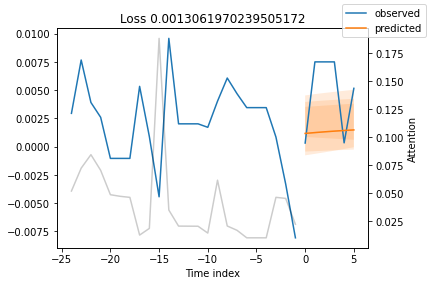

In [72]:

for idx in range(1):  # plot 10 examples
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);

### Worst performers

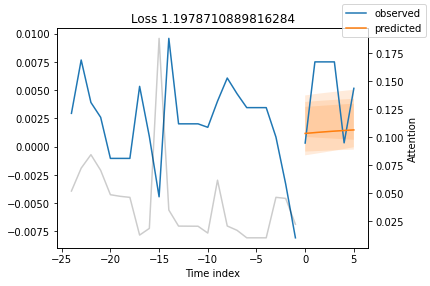

In [74]:
# calcualte metric by which to display
predictions = best_tft.predict(val_dataloader)
mean_losses = SMAPE(reduction="none")(predictions, actuals).mean(1)
indices = mean_losses.argsort(descending=True)  # sort losses
for idx in range(1):  # plot 10 examples
    best_tft.plot_prediction(
        x, raw_predictions, idx=indices[idx], add_loss_to_title=SMAPE(quantiles=best_tft.loss.quantiles)
    );

### Actuals vs predictions by variables

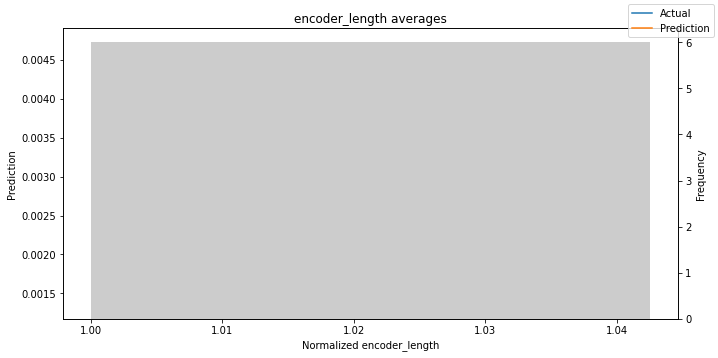

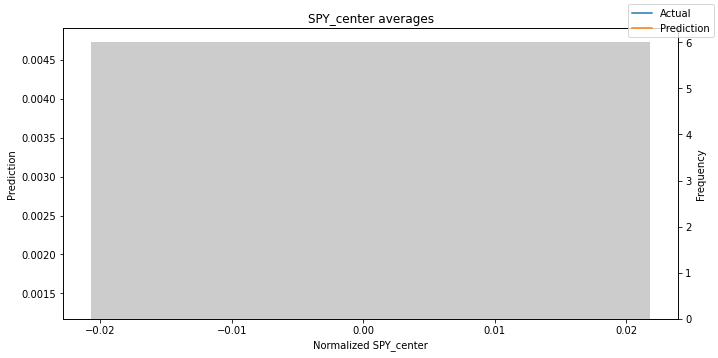

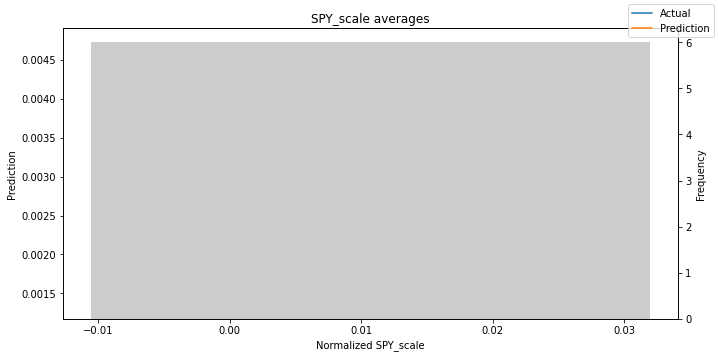

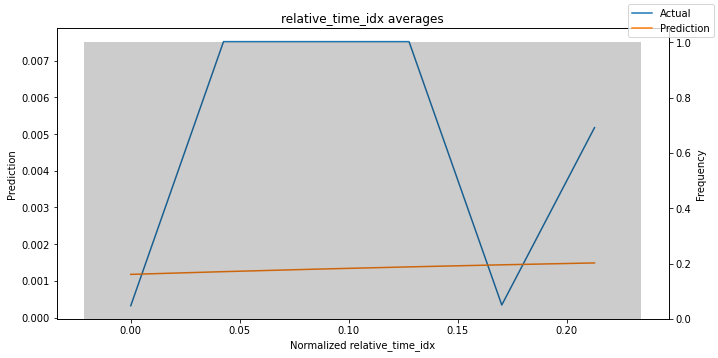

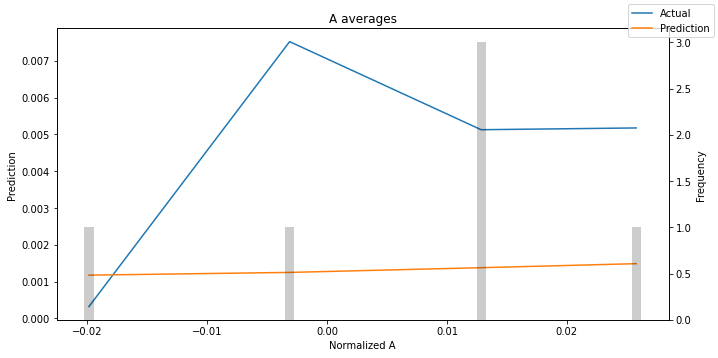

...

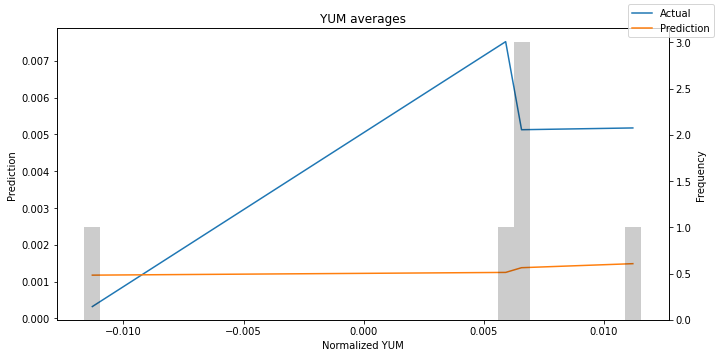

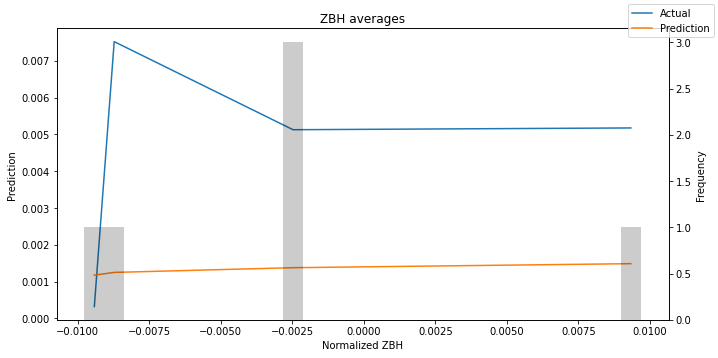

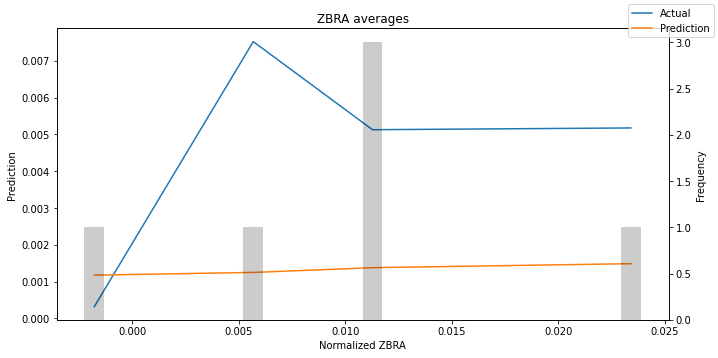

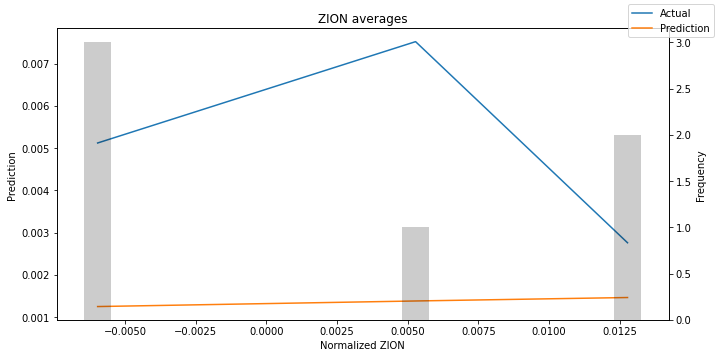

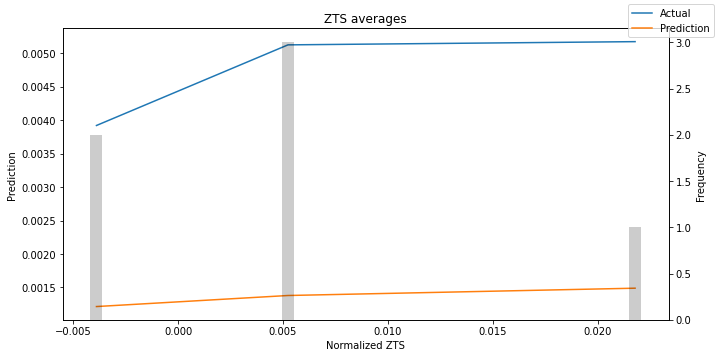

In [75]:
predictions, x = best_tft.predict(val_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(x, predictions)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals);

## 4. Predict on selected data

In [78]:
best_tft.predict(
    training.filter(lambda x: (x.agency == "Agency_01") & (x.sku == "SKU_01") & (x.time_idx_first_prediction == 15)),
    mode="quantiles",
)

AttributeError: 'dict' object has no attribute 'time_idx_first_prediction'

Of course, we can also plot this prediction readily:

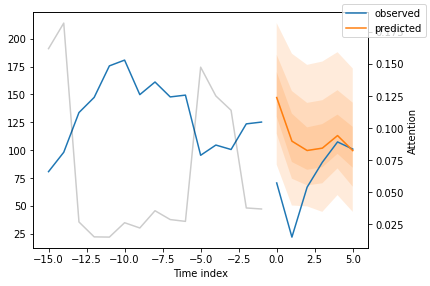

In [48]:
raw_prediction, x = best_tft.predict(
    training.filter(lambda x: (x.agency == "Agency_01") & (x.sku == "SKU_01") & (x.time_idx_first_prediction == 15)),
    mode="raw",
    return_x=True,
)
best_tft.plot_prediction(x, raw_prediction, idx=0);

## Predict on new data

Because we have covariates in the dataset, predicting on new data requires us to define the known covariates upfront.

In [80]:
# select last 24 months from data (max_encoder_length is 24)
encoder_data = data[lambda x: x.time_idx > x.time_idx.max() - max_encoder_length]

# select last known data point and create decoder data from it by repeating it and incrementing the month
# in a real world dataset, we should not just forward fill the covariates but specify them to account
# for changes in special days and prices (which you absolutely should do but we are too lazy here)
last_data = data[lambda x: x.time_idx == x.time_idx.max()]
decoder_data = pd.concat(
    [last_data.assign(date=lambda x: x.date + pd.offsets.MonthBegin(i)) for i in range(1, max_prediction_length + 1)],
    ignore_index=True,
)

# add time index consistent with "data"
decoder_data["time_idx"] = decoder_data["date"].dt.year * 12 + decoder_data["date"].dt.month
decoder_data["time_idx"] += encoder_data["time_idx"].max() + 1 - decoder_data["time_idx"].min()

# adjust additional time feature(s)
decoder_data["month"] = decoder_data.date.dt.month.astype(str).astype("category")  # categories have be strings

# combine encoder and decoder data
new_prediction_data = pd.concat([encoder_data, decoder_data], ignore_index=True)

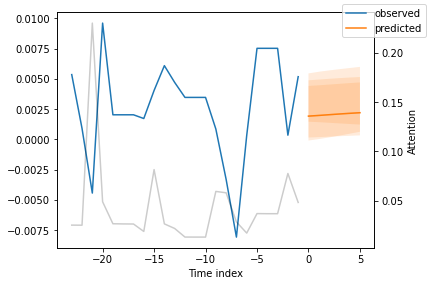

In [85]:
new_raw_predictions, new_x = best_tft.predict(new_prediction_data, mode="raw", return_x=True)

for idx in range(1):  # plot 10 examples
    best_tft.plot_prediction(new_x, new_raw_predictions, idx=idx, show_future_observed=False);

## Interpret model

### Variable importances

{'attention': <Figure size 432x288 with 1 Axes>,
 'static_variables': <Figure size 504x198 with 1 Axes>,
 'encoder_variables': <Figure size 504x8964 with 1 Axes>,
 'decoder_variables': <Figure size 504x162 with 1 Axes>}

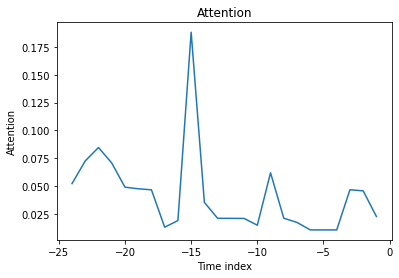

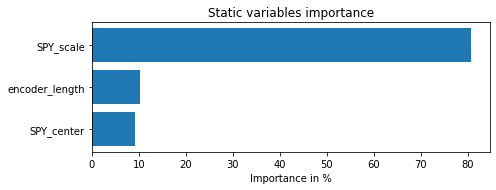

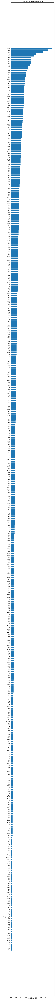

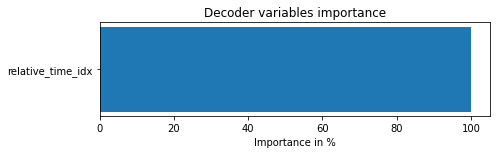

In [86]:
interpretation = best_tft.interpret_output(raw_predictions, reduction="sum")
best_tft.plot_interpretation(interpretation)

Unsurprisingly, the past observed volume features as the top variable in the encoder and price related variables are among the top predictors in the decoder.

The general attention patterns seems to be that more recent observations are more important and older ones. This confirms intuition. The average attention is often not very useful - looking at the attention by example is more insightful because patterns are not averaged out.

### Partial dependency

Partial dependency plots are often used to interpret the model better (assuming independence of features). They can be also useful to understand what to expect in case of simulations and are created with :py:meth:`~pytorch_forecasting.models.base_model.BaseModel.predict_dependency`.

In [90]:
dependency = best_tft.predict_dependency(
    val_dataloader.dataset, "discount_in_percent", np.linspace(0, 30, 30), show_progress_bar=True, mode="dataframe"
)

Predict:   0%|          | 0/30 [00:00<?, ? batches/s]

AssertionError: overwrite values variable has to be either in real or categorical variables

In [88]:
# plotting median and 25% and 75% percentile
agg_dependency = dependency.groupby("discount_in_percent").normalized_prediction.agg(
    median="median", q25=lambda x: x.quantile(0.25), q75=lambda x: x.quantile(0.75)
)
ax = agg_dependency.plot(y="median")
ax.fill_between(agg_dependency.index, agg_dependency.q25, agg_dependency.q75, alpha=0.3);

NameError: name 'dependency' is not defined